In [5]:
# pip install pyaudio

Note: you may need to restart the kernel to use updated packages.


In [54]:
pip install signal-envelope

Note: you may need to restart the kernel to use updated packages.


In [134]:
import pyaudio
import librosa, librosa.display
import numpy as np
import pylab
import time
import sys
import matplotlib.pyplot as plt
import wave
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd

RATE = 44100
CHUNK = int(RATE/20) # RATE / number of updates per second
frames = []
def soundplot(stream):
  
   t1=time.time()
   #use np.frombuffer if you face error at this line
   #data = np.fromstring(stream.read(CHUNK),dtype=np.int16)
   #print(data)
   data = stream.read(CHUNK)
   frames.append(data) 


print(data.shape);

if __name__=="__main__":
    p=pyaudio.PyAudio()
    stream=p.open(format=pyaudio.paInt16,channels=1,rate=RATE,input=True,
                  frames_per_buffer=CHUNK)
    #for i in range(sys.maxsize**10):
    for i in range(100):    #100 = 5 seconds
        soundplot(stream)
    stream.stop_stream()
    stream.close()
    p.terminate()
    
    wf = wave.open("output.wav",'wb')
    wf.setnchannels(1)
    #wf.setsampwidth(p.get_sample_size(pyaudio.paInt16))
    wf.setsampwidth(2)
    wf.setframerate(RATE)
    wf.writeframes(b''.join(frames))
    wf.close()
    
    
#added    
def main():
#    while i<5:
#        print ("recording...")
#        i = i + 1
    
    print("Hello world")    


(2048,)


In [135]:
    x, sr = librosa.load('output.wav')
    ipd.Audio(x, rate=sr)

In [46]:
    y, sr = librosa.load('audio/africa-toto.wav')
    ipd.Audio(y, rate=sr)

In [143]:
import signal_envelope as se

W, sr = se.read_wav("output.wav")
X_pos_frontier, X_neg_frontier = se.get_frontiers(W, 0)
print(X_pos_frontier, W[X_pos_frontier])


X_envelope = se.get_frontiers(W, 1)
print(X_envelope, np.abs(W[X_envelope]))

F = np.abs(W[X_envelope])
print(F)
print(F.shape)

output_norm = F / np.linalg.norm(F)
print(output_norm)
P = np.transpose(output_norm)
d = P.shape
print(d)

[    32     68     76     95    133    142    189    205    210    232
    239    248    271    296    305    315    326    348    360    370
    394    399    436    449    464   1123   1244   1425   1779   2668
   3165   3727   4077   4141   4317   4673   4742   4857   5209   5390
   5565   5918   6096   6454   6810   6990   7358   7776   8079   8259
   8626   9049   9350   9534   9896  10150  10576  10608  10701  10990
  11317  12117  12359  12720  12951  13064  13378  13481  13592  13761
  13847  14009  14185  14361  14716  14840  15025  15142  15449  15562
  15731  15904  16045  16274  16413  16673  16836  17025  17109  17387
  17522  17812  17874  18229  18653  18803  18939  19073  19216  19353
  19781  19923  20117  20587  20815  21240  21666  22375  23051  23358
  23734  24125  24301  24530  24929  25110  25189  25339  25746  25910
  25995  26158  26570  26810  26983  27165  27570  27830  27987  28253
  28508  28676  29107  29296  29474  29663  29967  30057  30235  30387
  3056

(2020,)
(2020,)


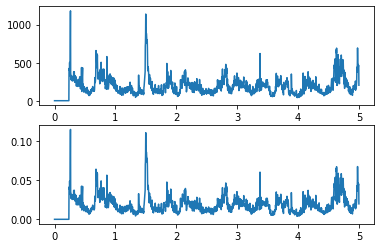

In [145]:
#not working
import numpy as np
#plt.figure(figsize=(14, 5))
#librosa.display.waveplot(W, alpha=0.6)
#plt.vlines(beat_times, -1, 1, color='r')
#plt.ylim(-1, 1)
t = np.arange(0,5,5/2020)
#t = np.transpose(t)
print (t.shape)
print (F.shape)
F = np.transpose(F)
#print (t)
plt.subplot(2,1,1)
plt.plot(t, F)
plt.subplot(2,1,2)
plt.plot(t,P)

In [140]:
import signal_envelope as se

W, sr = se.read_wav("audio/africa-toto.wav")
X_pos_frontier, X_neg_frontier = se.get_frontiers(W, 0)
print(X_pos_frontier, W[X_pos_frontier])


X_envelope = se.get_frontiers(W, 1)
print(X_envelope, np.abs(W[X_envelope]))

F = np.abs(W[X_envelope])

song_norm = F / np.linalg.norm(F)
print(song_norm)

[      0    5020    5204 ... 6554767 6554825 6554833] [ 0.  1. 11. ...  1.  0.  1.]
[      0 6554833] [0. 1.]
[0. 1.]


In [141]:
import signal_envelope as se

W, sr = se.read_wav("audio/africa-toto.wav")
Y_pos_frontier, Y_neg_frontier = se.get_frontiers(W, 0)
print(Y_pos_frontier, Z[Y_pos_frontier])

Y_envelope = se.get_frontiers(W, 1)
print(Y_envelope, np.abs(W[Y_envelope]))

[      0    5020    5204 ... 6554767 6554825 6554833] [ 0.  1. 11. ...  1.  0.  1.]
[      0 6554833] [0. 1.]


In [68]:
r = numpy.correlate(X_envelope, Y_envelope)
print(X_envelope.shape, r.shape)

(19621,) (19620,)


(0.0, 10000.0)

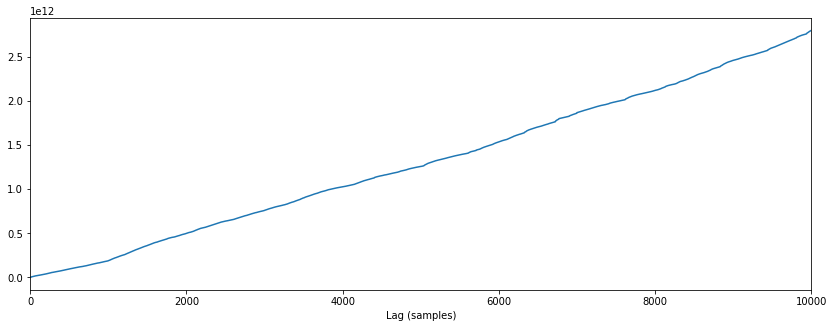

In [69]:
plt.figure(figsize=(14, 5))
plt.plot(r[:10000])
plt.xlabel('Lag (samples)')
plt.xlim(0, 10000)